<a href="https://colab.research.google.com/github/d-vf/P2PEnergyTrading/blob/main/Demand_and_supply_simulation_09_23.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Build a baseline to compare trading and not trading

Baseline = loads are fulfilled by retailer, so this is demand

typical load profiles (households, commercial)

If needed to get TS shapefiles. -> https://colab.research.google.com/drive/1IDVyuISPzNrBQJe5HOxQSZoZLMtd9C6c#scrollTo=sU8wwOrzVP1y

Data:

https://www.nrel.gov/buildings/end-use-load-profiles.html

Demand: (End Use Load Profiles for the U.S. Building Stock) https://data.openei.org/submissions/4520 (PA, ISO, PJM aggregate TS)

National Renewable Energy Laboratory (NREL). (2021). End-Use Load Profiles for the U.S. Building Stock [data set]. Retrieved from https://dx.doi.org/10.25984/1876417.

https://data.openei.org/s3_viewer?bucket=oedi-data-lake&prefix=nrel-pds-building-stock%2Fend-use-load-profiles-for-us-building-stock%2F2023%2Fcomstock_amy2018_release_1%2Ftimeseries_aggregates%2Fby_iso_rto_region%2Fupgrade%3D0%2Fiso_rto_region%3DPJM%2F

oedi-data-lakenrel-pds-building-stockend-use-load-profiles-for-us-building-stock2023comstock_amy2018_release_1timeseries_aggregatesby_iso_rto_regionupgrade%3D0iso_rto_region%3DPJM


(also have ERSE/DGEG by voltage levels)

Supply (do 10, 30 and 50 of buses)

Solar https://globalsolaratlas.info/map (assuming 3kwp)


Trading add additional supply (I can use the assumption used for self consumption, capped on kVA, the excess, most is solar or storage).
Argument: electricity by nature is quite ineslaticic, there are some loads can be shifted or stored, but there is a baseload.

Pricing:, e.g.
I can use E-Redes pricing (they receive nothing or 0.01€/kWh), electricity price (power and electricity, where less than ⅓ is actual network costs)
EDP P (0,1958 €) * x  kWh + 0,2458 € (6,9 kVA) * 31 days (+ VAT and “CIEG” or stuff that goes in as special costs related to sustainability and other stuff the government decides..)

Other:

https://www.nrel.gov/grid/solar-resource/renewable-resource-data.html

https://nrel.github.io/PyDSS/Extended%20controls%20library.html

I can check losses or more use of distributed resources (this case would need the energy mix)
Can use peak, off peak…


## Data, Libraries, set-up

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
os.environ["MOSEKLM_LICENSE_FILE"] = "/content/drive/MyDrive/Diana Vieira Fernandes - Work folder/Qual A/mosek.lic"

In [ ]:
os.chdir("/content/drive/MyDrive/Diana Vieira Fernandes - Work folder/Qual A/Data")

In [ ]:
!ls "/content/drive/MyDrive/Diana Vieira Fernandes - Work folder/Qual A/Data"

 100006-0.parquet
 8500node.zip
'8500node.zip (Unzipped Files)'
 9500-Node-Model-Submission-Model-Files.zip
'9500-Node-Model-Submission-Model-Files.zip (Unzipped Files)'
 annual_solar_value_by_plant_and_county_0.xlsx
 cluster_medians_com.csv
 cluster_medians.csv
 cluster_medians_solar.csv
 European_LV_Test_Feeder_v2.zip
'European_LV_Test_Feeder_v2.zip (Unzipped Files)'
 feeder34.zip
'feeder34.zip (Unzipped Files)'
 GSA_Report_Pittsburgh.xlsx
 gwa-plot-data_2023-09-03169376876345007_19_23_UTC.zip
 IEEE34Node.zip
 median_loads_per_hour.csv
 metadata.tsv
 monte_carlo_power_output_simulation.csv
 monte_carlo_simulation.csv
 networks_hour
'pa-pv-2006 .zip'
'pa-pv-2006 .zip (Unzipped Files)'
 temp-plot.html
 up00-pjm-mediumoffice.csv
 up00-pjm-single-family_attached.csv
 up01-pa-mobile_home.csv
 your_problem.lp


In [ ]:
!apt-get install -y graphviz libgraphviz-dev #data viz
!pip install pygraphviz diagrams # diagrams
!pip install pandapower["all"] #data
! pip install scipy
!pip install pandapower["all"] #data
!apt-get install -y -qq glpk-utils #solver
! pip install cplex #SDP
! pip install cvxpy[mosek] #(SDP/CP)
!apt-get install -y -qq coinor-cbc #interior poit method
! pip install gurobipy #gurobi (MILP)
! pip install scipy #transform .m to .pp
!pip install pydot graphviz # for HG

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
graphviz is already the newest version (2.42.2-6).
libgraphviz-dev is already the newest version (2.42.2-6).
0 upgraded, 0 newly installed, 0 to remove and 18 not upgraded.


## Profiles

(https://data.openei.org/submissions/4520)

In [ ]:
#url_meta = pd.read_csv('/content/drive/MyDrive/Diana Vieira Fernandes - Work folder/Qual A/Data/metadata.tsv', sep='\t')

In [ ]:
#url_meta

,Unnamed: 0,bldg_id,in.county,in.puma,in.ashrae_iecc_climate_zone_2004,in.building_america_climate_zone,in.iso_rto_region,applicability,weight,in.sqft,in.ahs_region,in.applicable,in.bathroom_spot_vent_hour,in.bedrooms,in.cec_climate_zone,in.ceiling_fan,in.census_division,in.census_division_recs,in.census_region,in.clothes_dryer,in.clothes_washer,in.clothes_washer_presence,in.cooking_range,in.cooling_setpoint,in.cooling_setpoint_has_offset,in.cooling_setpoint_offset_magnitude,in.cooling_setpoint_offset_period,in.corridor,in.dehumidifier,in.dishwasher,in.door_area,in.doors,in.ducts,in.eaves,in.electric_vehicle,in.geometry_attic_type,in.geometry_building_horizontal_location_mf,in.geometry_building_horizontal_location_sfa,in.geometry_building_level_mf,in.geometry_building_number_units_mf,in.geometry_building_number_units_sfa,in.geometry_building_type_acs,in.geometry_building_type_height,in.geometry_building_type_recs,in.geometry_floor_area,in.geometry_floor_area_bin,in.geometry_foundation_type,in.geometry_garage,in.geometry_stories,in.geometry_stories_low_rise,in.geometry_wall_exterior_finish,in.geometry_wall_type,in.geometry_wall_type_and_exterior_finish,in.has_pv,in.heating_fuel,in.heating_setpoint,in.heating_setpoint_has_offset,in.heating_setpoint_offset_magnitude,in.heating_setpoint_offset_period,in.holiday_lighting,in.hot_water_distribution,in.hot_water_fixtures,in.hvac_cooling_efficiency,in.hvac_cooling_type,in.hvac_has_ducts,in.hvac_has_shared_system,in.hvac_has_zonal_electric_heating,in.hvac_heating_efficiency,in.hvac_heating_type,in.hvac_heating_type_and_fuel,in.hvac_secondary_heating_efficiency,in.hvac_secondary_heating_type_and_fuel,in.hvac_shared_efficiencies,in.hvac_system_is_faulted,in.hvac_system_single_speed_ac_airflow,in.hvac_system_single_speed_ac_charge,in.hvac_system_single_speed_ashp_airflow,in.hvac_system_single_speed_ashp_charge,in.infiltration,in.insulation_ceiling,in.insulation_floor,in.insulation_foundation_wall,in.insulation_roof,in.insulation_slab,in.insulation_wall,in.interior_shading,in.lighting,in.lighting_interior_use,in.lighting_other_use,in.location_region,in.mechanical_ventilation,in.misc_extra_refrigerator,in.misc_freezer,in.misc_gas_fireplace,in.misc_gas_grill,in.misc_gas_lighting,in.misc_hot_tub_spa,in.misc_pool,in.misc_pool_heater,in.misc_pool_pump,in.misc_well_pump,in.natural_ventilation,in.neighbors,in.occupants,in.orientation,in.overhangs,in.plug_load_diversity,in.plug_loads,in.pv_orientation,in.pv_system_size,in.radiant_barrier,in.range_spot_vent_hour,in.reeds_balancing_area,in.refrigerator,in.roof_material,in.schedules,in.setpoint_demand_response,in.solar_hot_water,in.state,in.units_represented,in.usage_level,in.vacancy_status,in.vintage,in.vintage_acs,in.water_heater_efficiency,in.water_heater_fuel,in.water_heater_in_unit,in.weather_file_city,in.weather_file_latitude,in.weather_file_longitude,in.window_areas,in.windows,in.nhgis_county_gisjoin,in.nhgis_puma_gisjoin,in.state_name,in.american_housing_survey_region,in.weather_file_2018,in.weather_file_TMY3,in.resstock_county_id,in.resstock_puma_id,out.electricity.bath_fan.energy_consumption,out.electricity.bath_fan.energy_consumption_intensity,out.electricity.ceiling_fan.energy_consumption,out.electricity.ceiling_fan.energy_consumption_intensity,out.electricity.clothes_dryer.energy_consumption,out.electricity.clothes_dryer.energy_consumption_intensity,out.electricity.clothes_washer.energy_consumption,out.electricity.clothes_washer.energy_consumption_intensity,out.electricity.cooking_range.energy_consumption,out.electricity.cooking_range.energy_consumption_intensity,out.electricity.cooling.energy_consumption,out.electricity.cooling.energy_consumption_intensity,out.electricity.dishwasher.energy_consumption,out.electricity.dishwasher.energy_consumption_intensity,out.electricity.ext_holiday_light.energy_consumption,out.electricity.ext_holiday_light.energy_consumption_intensity,out.electricity.exterior_lighting.energy_consumption,out.electricity

In [ ]:
#import pandas as pd
#profile_1 = pd.read_parquet('/content/drive/MyDrive/Diana Vieira Fernandes - Work folder/Qual A/Data/100006-0.parquet')
#profile_1.head()

Do the aggregates have the sample weighting factors applied?
Yes, the aggregates represent the total "floor_area_represented" for commercial or "units_represented" for residential.

### Loads (Residential)

ISO (PJM, agg. single family)

In [ ]:
import pandas as pd
url = '/content/drive/MyDrive/Diana Vieira Fernandes - Work folder/Qual A/Data/up00-pjm-single-family_attached.csv'
profile_1_agg = pd.read_csv(url)

In [ ]:
profile_1_agg.head()

,upgrade,in.iso_rto_region,in.geometry_building_type_recs,timestamp,models_used,units_represented,out.electricity.ceiling_fan.energy_consumption.kwh,out.electricity.clothes_dryer.energy_consumption.kwh,out.electricity.clothes_washer.energy_consumption.kwh,out.electricity.cooling_fans_pumps.energy_consumption.kwh,out.electricity.cooling.energy_consumption.kwh,out.electricity.dishwasher.energy_consumption.kwh,out.electricity.freezer.energy_consumption.kwh,out.electricity.heating_fans_pumps.energy_consumption.kwh,out.electricity.heating_hp_bkup.energy_consumption.kwh,out.electricity.heating.energy_consumption.kwh,out.electricity.hot_tub_heater.energy_consumption.kwh,out.electricity.hot_tub_pump.energy_consumption.kwh,out.electricity.hot_water.energy_consumption.kwh,out.electricity.lighting_exterior.energy_consumption.kwh,out.electricity.lighting_garage.energy_consumption.kwh,out.electricity.lighting_interior.energy_consumption.kwh,out.electricity.mech_vent.energy_consumption.kwh,out.electricity.plug_loads.energy_consumption.kwh,out.electricity.pool_heater.energy_consumption.kwh,out.electricity.pool_pump.energy_consumption.kwh,out.electricity.pv.energy_consumption.kwh,out.electricity.range_oven.energy_consumption.kwh,out.electricity.refrigerator.energy_consumption.kwh,out.electricity.well_pump.energy_consumption.kwh,out.fuel_oil.heating_hp_bkup.energy_consumption.kwh,out.fuel_oil.heating.energy_consumption.kwh,out.fuel_oil.hot_water.energy_consumption.kwh,out.natural_gas.clothes_dryer.energy_consumption.kwh,out.natural_gas.fireplace.energy_consumption.kwh,out.natural_gas.grill.energy_consumption.kwh,out.natural_gas.heating_hp_bkup.energy_consumption.kwh,out.natural_gas.heating.energy_consumption.kwh,out.natural_gas.hot_tub_heater.energy_consumption.kwh,out.natural_gas.hot_water.energy_consumption.kwh,out.natural_gas.lighting.energy_consumption.kwh,out.natural_gas.pool_heater.energy_consumption.kwh,out.natural_gas.range_oven.energy_consumption.kwh,out.propane.clothes_dryer.energy_consumption.kwh,out.propane.heating_hp_bkup.energy_consumption.kwh,out.propane.heating.energy_consumption.kwh,out.propane.hot_water.energy_consumption.kwh,out.propane.range_oven.energy_consumption.kwh,out.site_energy.net.energy_consumption.kwh,out.site_energy.total.energy_consumption.kwh,out.electricity.net.energy_consumption.kwh,out.electricity.total.energy_consumption.kwh,out.fuel_oil.total.energy_consumption.kwh,out.natural_gas.total.energy_consumption.kwh,out.propane.total.energy_consumption.kwh,out.load.cooling.energy_delivered.kbtu,out.load.heating.energy_delivered.kbtu,out.load.hot_water.energy_delivered.kbtu,out.emissions.all_fuels.lrmer_95decarbby2035_15_2025start.co2e_kg,out.emissions.all_fuels.lrmer_lowrecost_15_2025start.co2e_kg,out.emissions.all_fuels.lrmer_lowrecost_25_2025start.co2e_kg,out.emissions.all_fuels.lrmer_midcase_15_2025start.co2e_kg
0,0,PJM,Single-Family Attached,2012-01-01 00:15:00,12040,2.915257e+06,2716.952094,13279.433262,1311.623696,659.080617,20222.782183,652.543079,4855.93746,25585.257722,2096.128177,188321.511376,455.690566,665.618154,16416.482663,8770.469543,0.0,24872.666151,1267.555852,155063.848254,8.716716,269.491817,0.0,3219.858207,38051.857174,4230.028792,0.0,83069.559047,2444.414062,5965.883213,4517.486098,171.159367,0.0,1.236192e+06,365.736061,88502.875490,451.386706,54.356582,3772.247428,0.000000,0.0,3492.658743,283.562534,373.825682,1.943787e+06,1.943787e+06,514117.747848,514117.747848,85513.902148,1.339992e+06,4150.046959,50040.974269,4.435395e+06,477087.199285,459073.052473,623794.770586,582165.051288,614821.230990
1,0,PJM,Single-Family Attached,2012-01-01 00:30:00,12040,2.915257e+06,2658.598520,15933.915555,1660.050223,441.162705,20470.966471,466.828593,4855.93746,25446.274521,1799.759818,194112.316676,455.690566,665.618154,26344.338447,8770.469543,0.0,24453.537368,1267.555852,154309.368018,8.716716,269.491817,0.0,3538.986882,38051.857174,4230.028792,0.0,81252.303561,3914.809272,5267.763042,4517.486098,171.159

In [ ]:
profile_1_agg.shape

(35136, 62)

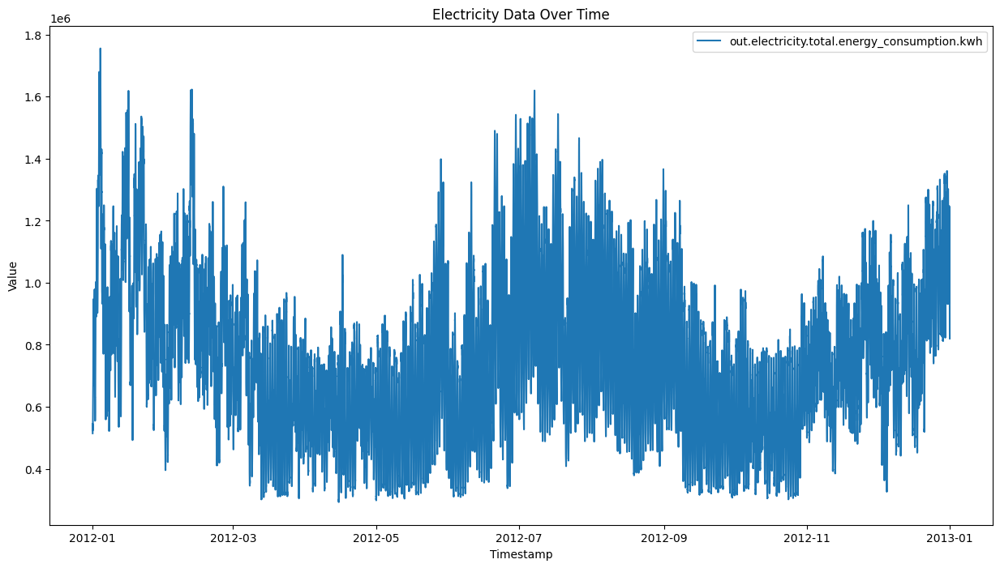

In [ ]:
import matplotlib.pyplot as plt

# Convert 'timestamp' to datetime and set as index
profile_1_agg['timestamp'] = pd.to_datetime(profile_1_agg['timestamp'])
profile_1_agg.set_index('timestamp', inplace=True)

#electricity_columns = [col for col in profile_1.columns if 'out.electricity.' in col]
electricity_columns = [col for col in profile_1_agg.columns if 'out.electricity.total' in col]
electricity_df = profile_1_agg[electricity_columns]

#units_represented = profile_1_agg['units_represented']
#electricity_df = electricity_df.divide(units_represented, axis='index')

# Plot
plt.figure(figsize=(15, 8))
for col in electricity_df.columns:
    plt.plot(electricity_df.index, electricity_df[col], label=col)

plt.legend(loc='upper right')
plt.title('Electricity Data Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.show()

In [ ]:
profile_1_agg.index = pd.to_datetime(profile_1_agg.index)
profile_1_agg['Date'] = profile_1_agg.index
profile_1_agg_hourly = profile_1_agg.resample('H').sum(numeric_only=True)

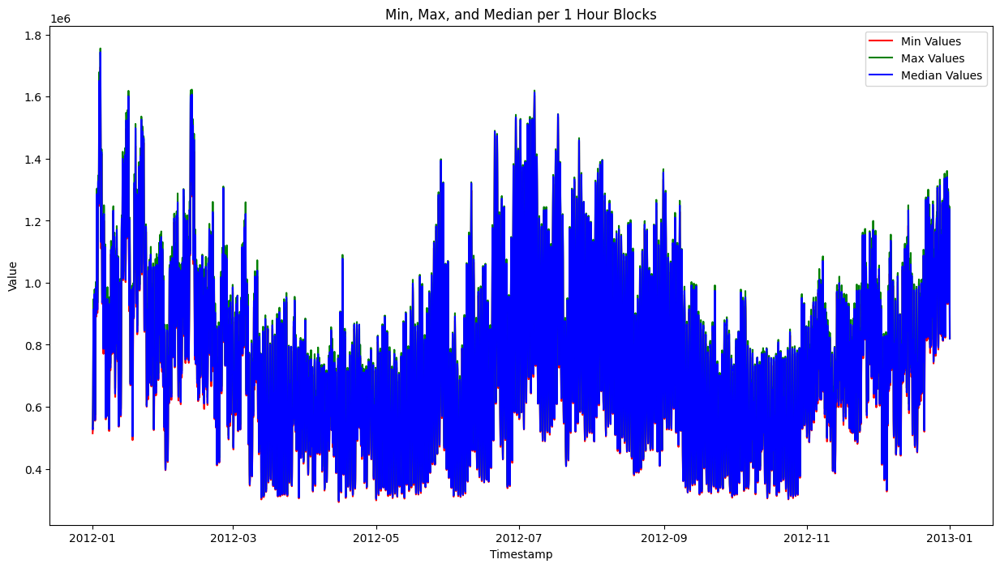

In [ ]:
import matplotlib.pyplot as plt

# Resample to 1-hour blocks and calculate min, max, median
resampled_df = profile_1_agg['out.electricity.total.energy_consumption.kwh'].resample('1H')
#electricity_df = electricity_df.divide(units_represented, axis='index')
min_values = resampled_df.min()
max_values = resampled_df.max()
median_values = resampled_df.median()

# Plot
plt.figure(figsize=(15, 8))

plt.plot(min_values.index, min_values, label='Min Values', color='red')
plt.plot(max_values.index, max_values, label='Max Values', color='green')
plt.plot(median_values.index, median_values, label='Median Values', color='blue')

plt.legend(loc='upper right')
plt.title('Min, Max, and Median per 1 Hour Blocks')
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import numpy as np


daily_data = profile_1_agg['out.electricity.total.energy_consumption.kwh'].resample('1H').sum()
daily_data = daily_data.apply(lambda x: pd.Series(x).fillna(method='ffill').tolist())
daily_df = pd.DataFrame(daily_data.tolist(), index=daily_data.index)

In [ ]:
daily_df['Date'] = daily_df.index
daily_df['hour'] = daily_df.index.hour
daily_df.index = daily_df.index.date
daily_df_pivot = daily_df.pivot(columns='hour')
daily_df_pivot = daily_df.dropna()

In [ ]:
daily_df.reset_index(drop=True, inplace=True)
daily_df.columns = ['Energy', 'Timestamp', 'Hour']

daily_df_pivot = daily_df.pivot(index='Timestamp', columns='Hour', values='Energy')
daily_df_pivot.interpolate(method='cubic', inplace=True)
daily_df_pivot = daily_df_pivot.interpolate(method='cubic')
daily_df_pivot.fillna(0, inplace=True)

<Axes: xlabel='Hour'>

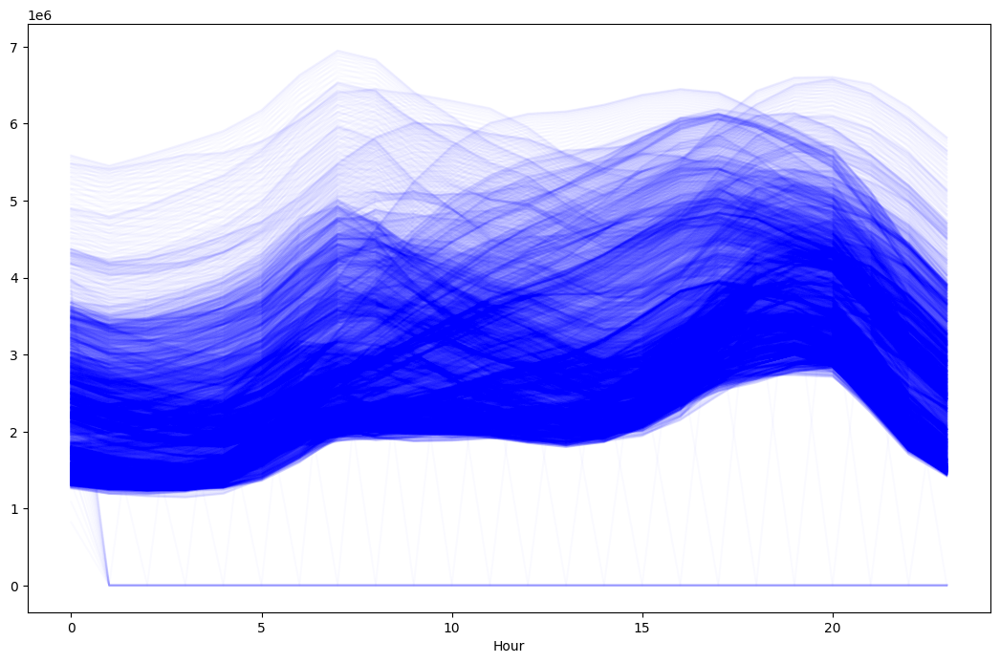

In [ ]:
daily_df_pivot.T.plot(figsize=(13,8), legend=False, color='blue', alpha=0.02)

#### silhouette_score to know k

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score
sillhoute_scores = []
n_cluster_list = np.arange(2,24).astype(int)

X = daily_df_pivot.values.copy()

# Very important to scale!
sc = MinMaxScaler()
X = sc.fit_transform(X)

for n_cluster in n_cluster_list:
  kmeans = KMeans(n_clusters=n_cluster, n_init=10)
  cluster_found = kmeans.fit_predict(X)
  sillhoute_scores.append(silhouette_score(X, kmeans.labels_))


sillhoute_scores_pandas = pd.DataFrame(sillhoute_scores)
sillhoute_scores_pandas = sillhoute_scores_pandas.rename(columns={0: "Score"})
sillhoute_scores_pandas['cluster'] = sillhoute_scores_pandas.index
sillhoute_scores_pandas['cluster'] += 1
sillhoute_scores_pandas

,Score,cluster
0,0.465593,1
1,0.483367,2
2,0.484156,3
3,0.440909,4
4,0.454757,5
5,0.411929,6
6,0.401552,7
7,0.383894,8
8,0.376634,9
9,0.359795,10


<Axes: xlabel='cluster'>

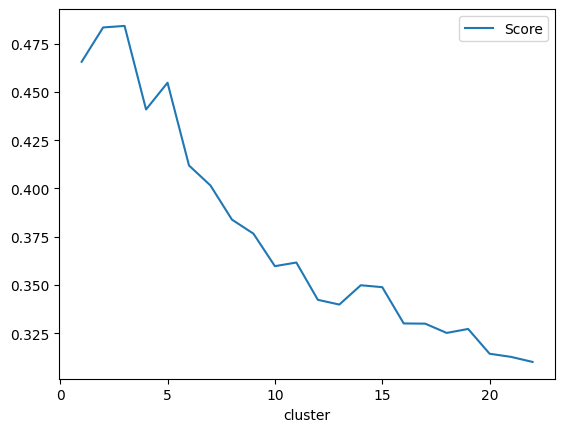

In [ ]:
sillhoute_scores_pandas.plot(x='cluster', y='Score')

Text(0.5, 0, 'Hour')

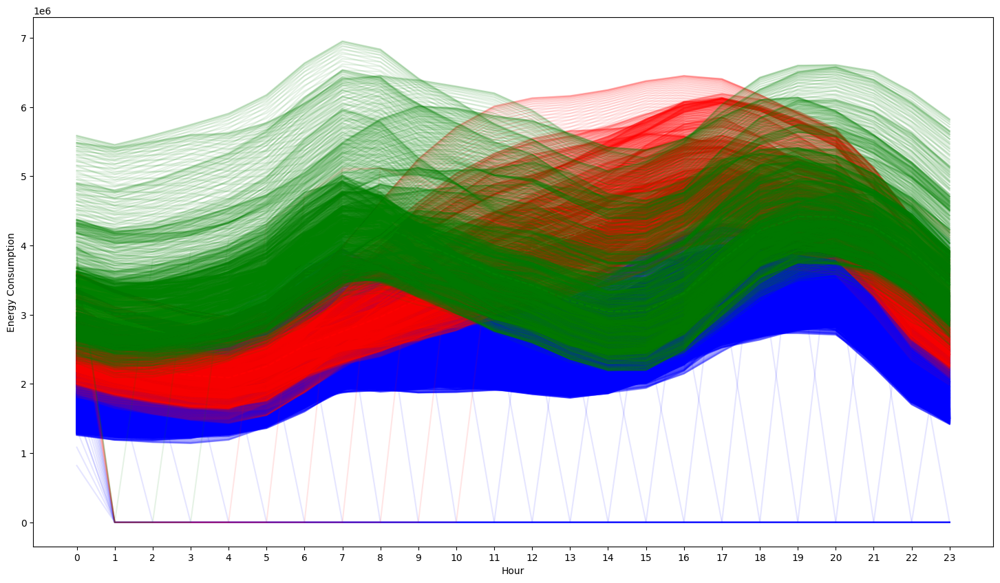

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

X = daily_df_pivot.values

# Scale the data
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Perform clustering
kmeans = KMeans(n_clusters=3, n_init=10)
daily_df_pivot['cluster'] = kmeans.fit_predict(X_scaled)

# Plot clusters
fig, ax = plt.subplots(1, 1, figsize=(18, 10))
colors = ['blue', 'red', 'green']

for cluster, color in zip(range(3), colors):
    data = daily_df_pivot[daily_df_pivot['cluster'] == cluster].drop('cluster', axis=1)
    data.T.plot(ax=ax, legend=False, alpha=0.1, color=color)
    data.median().plot(ax=ax, color=color, alpha=0.9, ls='--')

ax.set_xticks(np.arange(0, 24))
ax.set_ylabel('Energy Consumption')
ax.set_xlabel('Hour')

Text(0.5, 0, 'Hour')

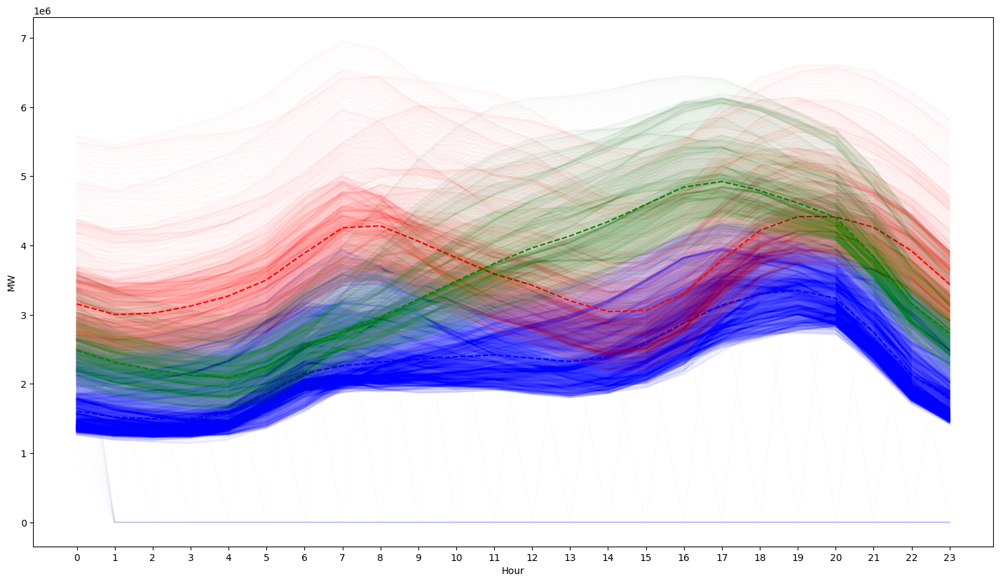

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(18, 10))
color_list = ['blue', 'red', 'green']

cluster_values = daily_df_pivot['cluster'].unique()

for cluster, color in zip(cluster_values, color_list):
    data_to_plot = daily_df_pivot[daily_df_pivot['cluster'] == cluster].drop('cluster', axis=1)
    data_to_plot.T.plot(ax=ax, legend=False, alpha=0.01, color=color)
    data_to_plot.median().plot(ax=ax, color=color, legend=False, alpha=1, ls='--')

ax.set_xticks(np.arange(0, 24))
ax.set_ylabel('MW')
ax.set_xlabel('Hour')


In [ ]:
# Get the units_represented value
units_represented = profile_1_agg['units_represented'] #
models_used = 12040

# Create an empty DataFrame for storing median values
medians_df = pd.DataFrame()

# Loop through each cluster to calculate the median
for cluster in daily_df_pivot['cluster'].unique():
    data_to_plot = daily_df_pivot[daily_df_pivot['cluster'] == cluster].drop('cluster', axis=1)
    median_values = data_to_plot.median()

    # Divide by units_represented
    median_values /= 1e+06
    #median_values /= 2.915257e+06
    #median_values /= 12040



    medians_df[f'Cluster_{cluster}'] = median_values

# Save the median values to a CSV file
medians_df.to_csv('cluster_medians.csv')

In [ ]:
medians_df

,Cluster_0,Cluster_2,Cluster_1
Hour,,,
0,1.606290,3.154254,2.482768
1,1.519643,3.000622,2.311636
2,1.495895,3.020217,2.200675
3,1.494952,3.123642,2.122012
4,1.580592,3.269917,2.089655
5,1.848416,3.500391,2.252033
6,2.149726,3.889361,2.549186
7,2.261614,4.253800,2.755853
8,2.313014,4.283941,2.965856


In [ ]:
import pandapower.networks as pn
from pandapower.plotting.plotly import vlevel_plotly

net = pn.create_cigre_network_lv()
# Number of buses
n_buses = len(net.bus)

In [ ]:
import numpy as np
import pandas as pd

n_iterations = 10


monte_carlo_list = []

# Perform Monte Carlo simulation
for i in range(n_iterations):
    for bus in range(n_buses):
        # Randomly choose a cluster for this bus
        chosen_cluster = np.random.choice(['Cluster_1', 'Cluster_0', 'Cluster_2'])

        # Generate random load for each hour based on median value of the chosen cluster
        load_for_each_hour = np.random.normal(medians_df[chosen_cluster], 0.1, size=24)

        # Store in a Series and append to list
        monte_carlo_list.append(pd.Series(load_for_each_hour, name=f'Iteration_{i}_Bus_{bus}'))

# Create DataFrame from list of Series
monte_carlo_df = pd.concat(monte_carlo_list, axis=1)

# Save the simulated values to a CSV file
monte_carlo_df.to_csv('monte_carlo_simulation.csv')


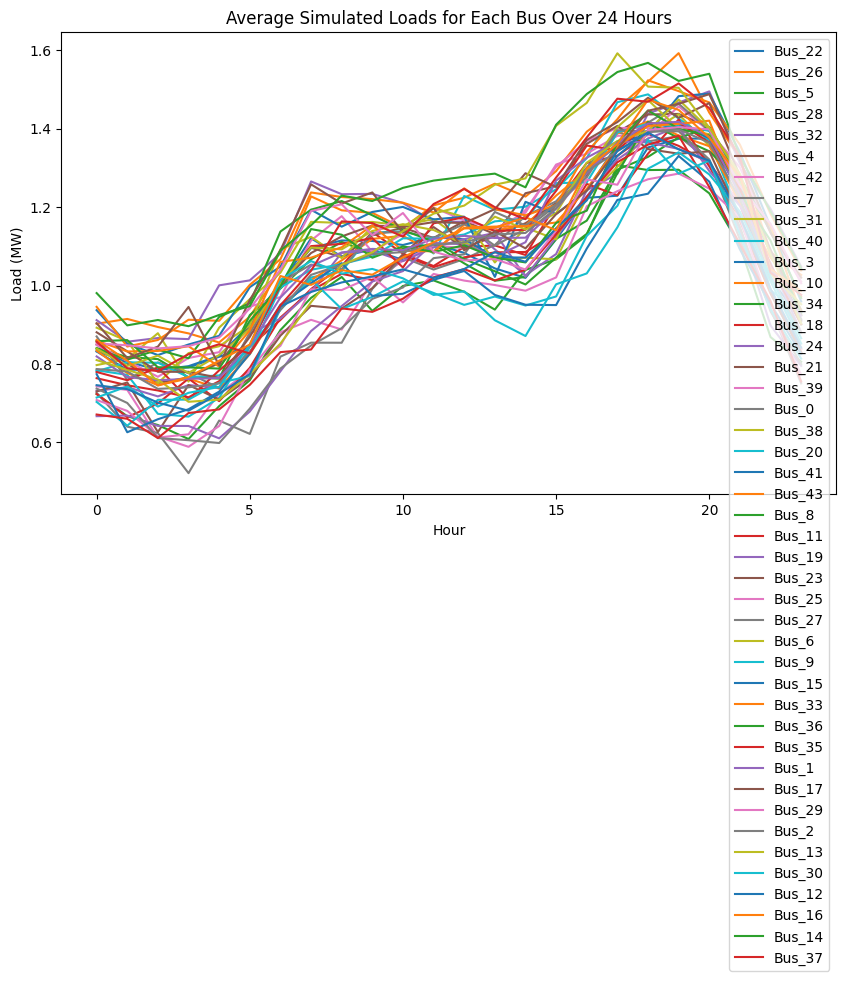

In [ ]:
import matplotlib.pyplot as plt

# Extract unique bus identifiers
unique_buses = set(col.split('_')[-1] for col in monte_carlo_df.columns if 'Bus' in col)

fig, ax = plt.subplots(figsize=(10, 6))

# Loop through each unique bus
for bus in unique_buses:

    # Extract all the loads for this bus across 24 hours for each iteration
    loads_for_all_iterations = monte_carlo_df.filter(like=f'Bus_{bus}')

    # Calculate the mean load across all iterations for each hour
    mean_loads = loads_for_all_iterations.mean(axis=1)

    # Create a line chart for each bus using the mean load
    ax.plot(range(24), mean_loads, label=f'Bus_{bus}')

ax.set_title('Average Simulated Loads for Each Bus Over 24 Hours')
ax.set_xlabel('Hour')
ax.set_ylabel('Load (MW)')
ax.legend()

plt.show()

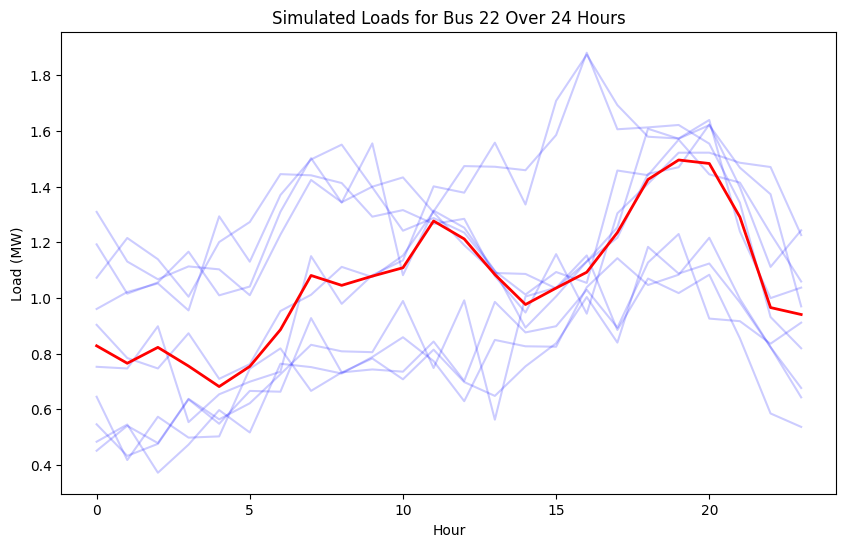

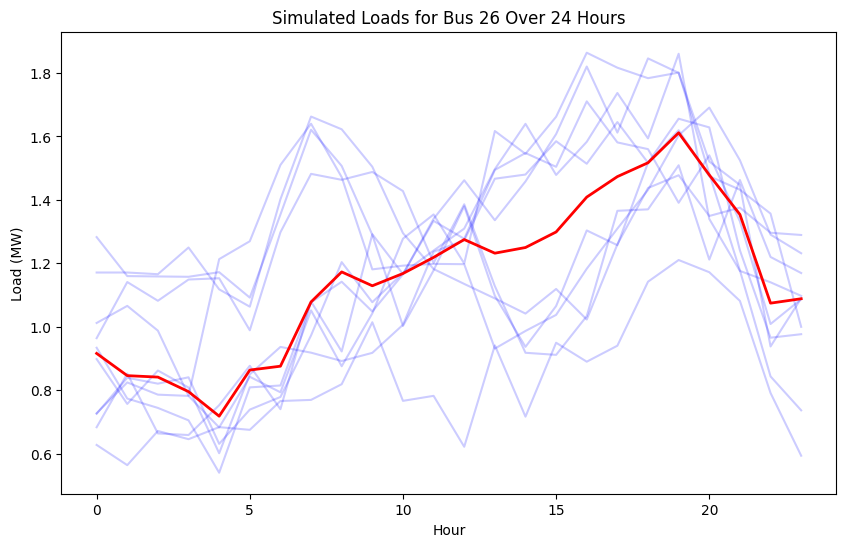

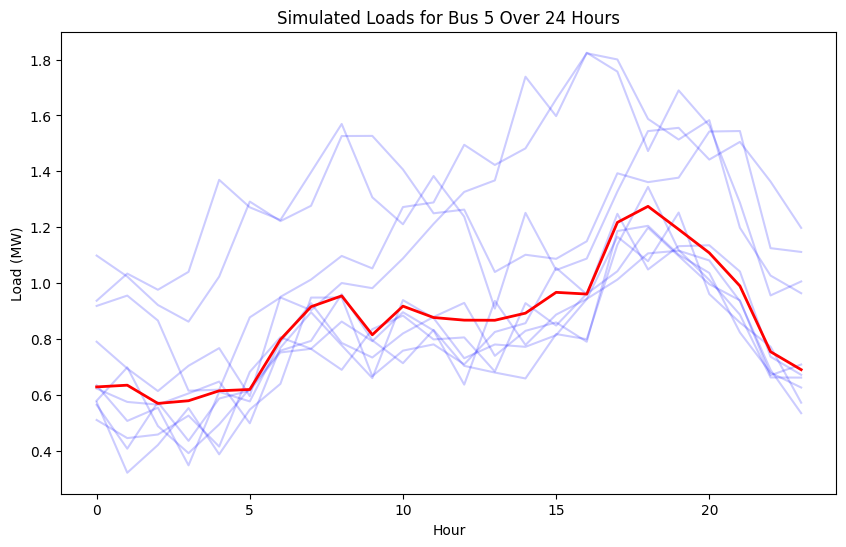

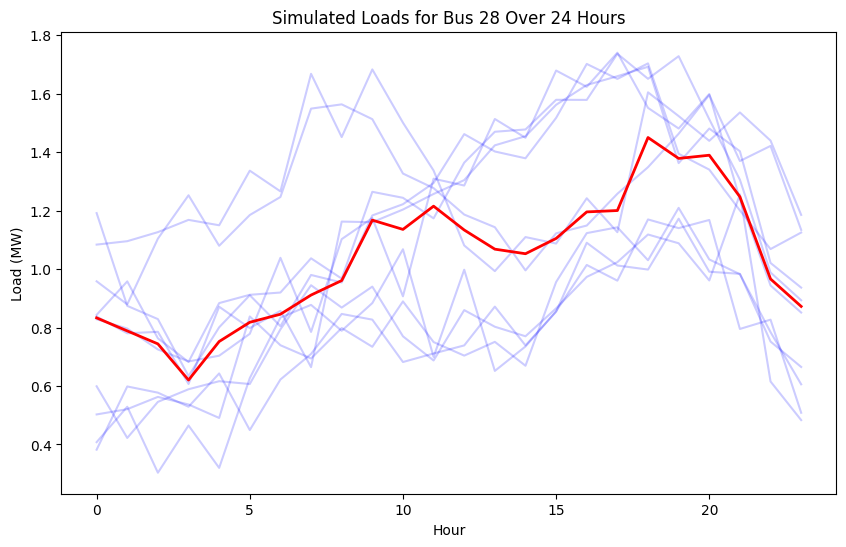

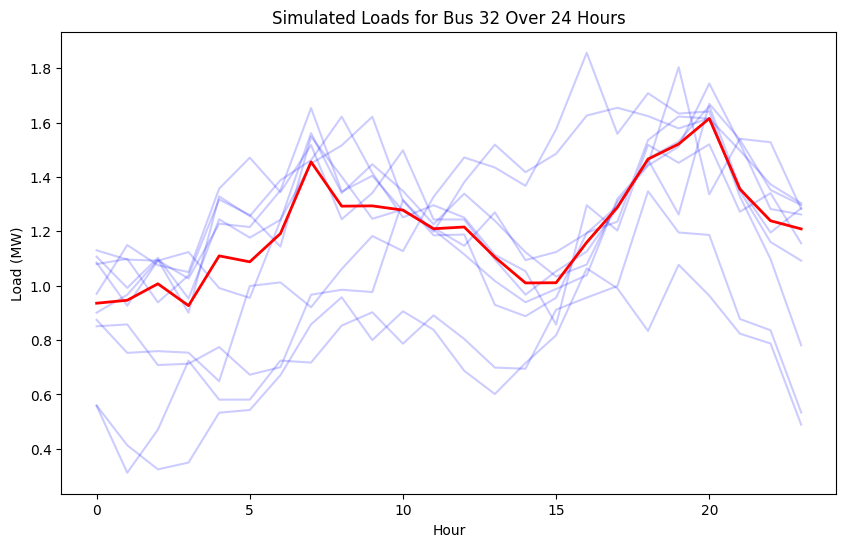

...

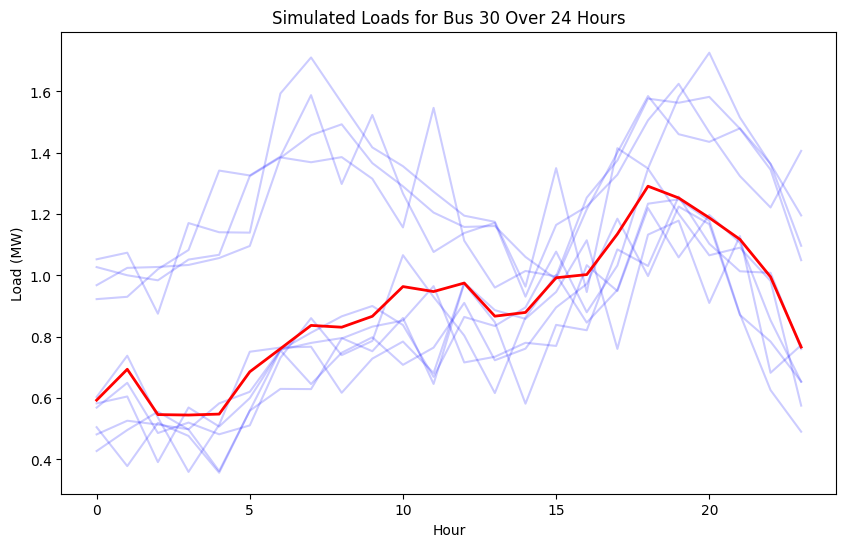

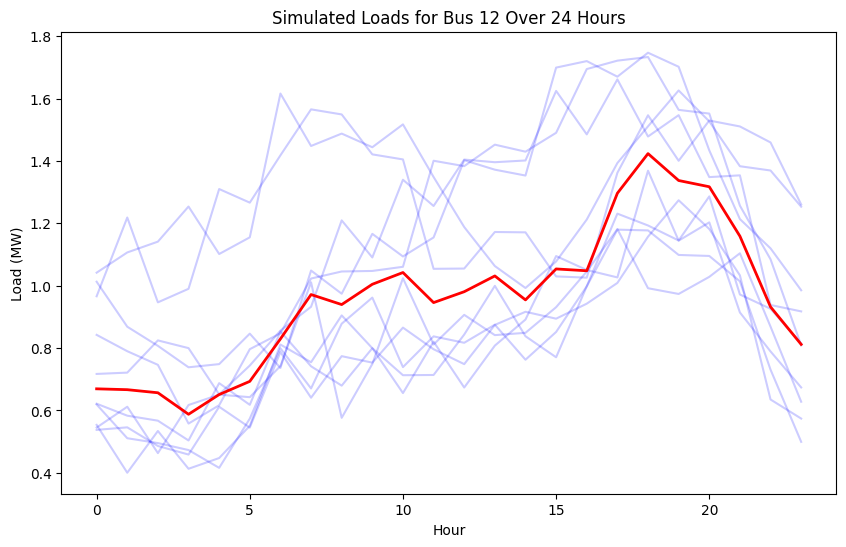

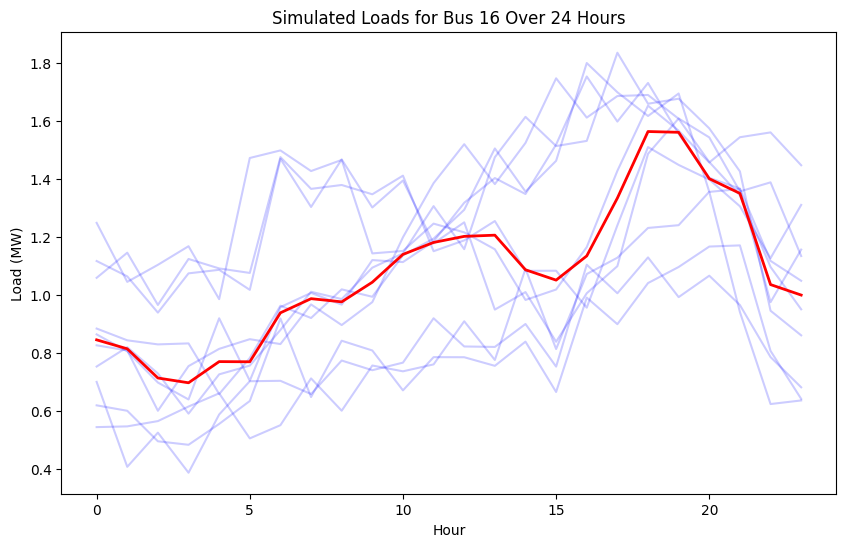

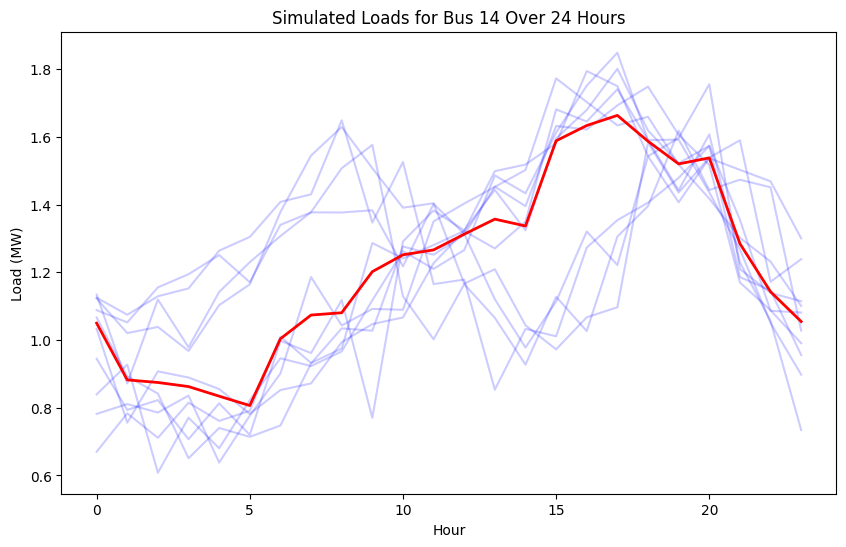

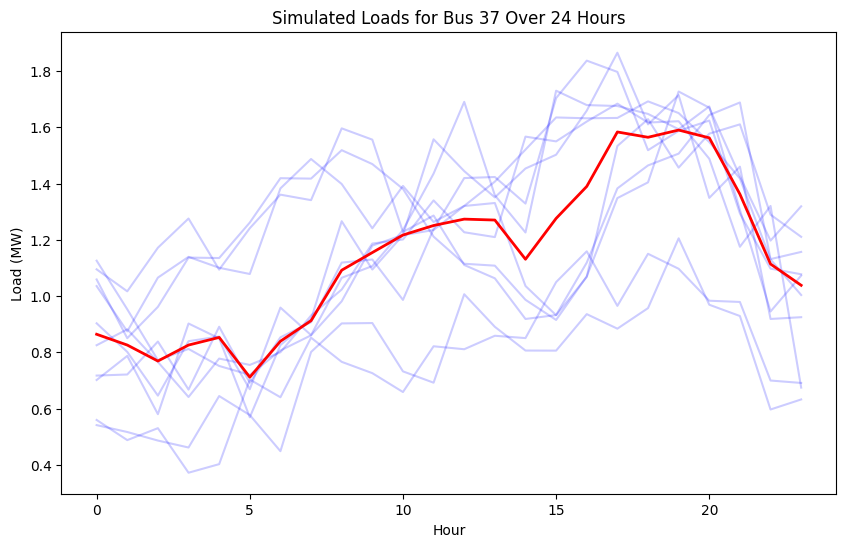

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Extract unique bus identifiers
unique_buses = set(col.split('_')[-1] for col in monte_carlo_df.columns if 'Bus' in col)

for bus in unique_buses:

    # Initialize a new plot for this bus
    fig, ax = plt.subplots(figsize=(10, 6))

    # Extract all the loads for this bus across all iterations
    loads_for_all_iterations = monte_carlo_df.filter(like=f'Bus_{bus}')

    # Plot each iteration's load for this bus with lighter color
    for iteration in range(loads_for_all_iterations.shape[1]):
        ax.plot(range(24), loads_for_all_iterations.iloc[:, iteration], alpha=0.2, color='blue')

    # Calculate and plot the median load for each hour
    median_loads = np.median(loads_for_all_iterations, axis=1)
    ax.plot(range(24), median_loads, color='red', linewidth=2)

    ax.set_title(f'Simulated Loads for Bus {bus} Over 24 Hours')
    ax.set_xlabel('Hour')
    ax.set_ylabel('Load (MW)')

    plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Extract unique bus identifiers
unique_buses = set(col.split('_')[-1] for col in monte_carlo_df.columns if 'Bus' in col)

# Create a dictionary to store median loads for each bus
median_loads_dict = {}

# Loop through each unique bus
for bus in unique_buses:
    # Extract all the loads for this bus across all iterations
    loads_for_all_iterations = monte_carlo_df.filter(like=f'Bus_{bus}')

    # Calculate the median load for each hour
    median_loads = np.median(loads_for_all_iterations, axis=1)

    # Store the median loads in the dictionary
    median_loads_dict[bus] = median_loads

# Create a DataFrame from the dictionary
median_loads_df = pd.DataFrame(median_loads_dict, index=range(24))

# Save the DataFrame to a CSV file
median_loads_df.to_csv('median_loads_per_hour.csv', index_label='Hour')


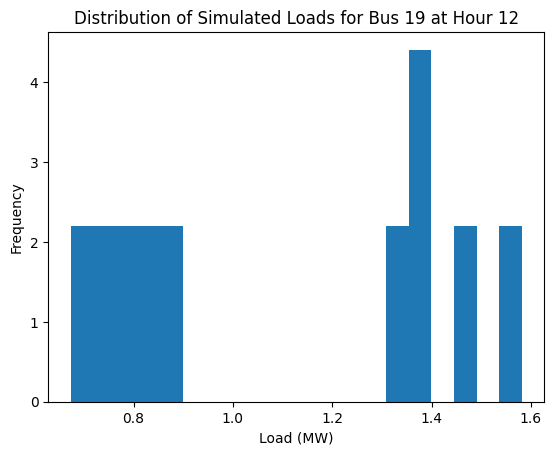

In [ ]:
import matplotlib.pyplot as plt

# Choose a specific bus and hour for plotting
bus = 19
hour = 12

# Extract all the loads for this bus and hour across all iterations
loads = monte_carlo_df.filter(like=f'Bus_{bus}').iloc[hour]

# Create histogram
plt.hist(loads, bins=20, density=True)
plt.title(f'Distribution of Simulated Loads for Bus {bus} at Hour {hour}')
plt.xlabel('Load (MW)')
plt.ylabel('Frequency')
plt.show()

## Loads (Commercial)

In [ ]:
import pandas as pd
url = '/content/drive/MyDrive/Diana Vieira Fernandes - Work folder/Qual A/Data/up00-pjm-mediumoffice.csv'
profile_com_agg = pd.read_csv(url)

In [ ]:
profile_com_agg.head()

,upgrade,in.iso_rto_region,in.comstock_building_type,models_used,floor_area_represented,out.district_cooling.cooling.energy_consumption.kwh,out.district_heating.heating.energy_consumption.kwh,out.district_heating.water_systems.energy_consumption.kwh,out.electricity.cooling.energy_consumption.kwh,out.electricity.exterior_lighting.energy_consumption.kwh,out.electricity.fans.energy_consumption.kwh,out.electricity.heat_recovery.energy_consumption.kwh,out.electricity.heat_rejection.energy_consumption.kwh,out.electricity.heating.energy_consumption.kwh,out.electricity.interior_equipment.energy_consumption.kwh,out.electricity.interior_lighting.energy_consumption.kwh,out.electricity.pumps.energy_consumption.kwh,out.electricity.refrigeration.energy_consumption.kwh,out.electricity.water_systems.energy_consumption.kwh,out.natural_gas.heating.energy_consumption.kwh,out.natural_gas.interior_equipment.energy_consumption.kwh,out.natural_gas.water_systems.energy_consumption.kwh,out.district_cooling.total.energy_consumption.kwh,out.district_heating.total.energy_consumption.kwh,out.electricity.total.energy_consumption.kwh,out.natural_gas.total.energy_consumption.kwh,out.other_fuel.cooling.energy_consumption.kwh,out.site_energy.total.energy_consumption.kwh,out.district_heating.cooling.energy_consumption.kwh,out.natural_gas.cooling.energy_consumption.kwh,out.other_fuel.interior_equipment.energy_consumption.kwh,out.other_fuel.water_systems.energy_consumption.kwh,out.other_fuel.total.energy_consumption.kwh,out.other_fuel.heating.energy_consumption.kwh
timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:15:00,0,PJM,MediumOffice,1673,1.017629e+09,214.951228,20534.208933,19.545094,3710.517557,29729.871428,56318.903667,179.890143,8.312099,199448.946778,121166.691365,29588.847761,3257.586420,0.0,436.040193,281300.740986,0.0,448.536099,214.951228,20553.754027,443845.607412,281749.277085,0.0,750214.982517,0.0,0.0,0.0,27.131588,3851.392765,3824.261177
2018-01-01 00:30:00,0,PJM,MediumOffice,1673,1.017629e+09,229.562171,20627.283438,22.983379,3754.829241,29729.871428,56512.151032,178.831561,8.276156,197567.562849,120856.740040,29719.623445,3270.706196,0.0,651.932969,281044.071430,0.0,739.024246,229.562171,20650.266817,442250.524917,281783.095677,0.0,748719.453432,0.0,0.0,0.0,29.272857,3806.003851,3776.730993
2018-01-01 00:45:00,0,PJM,MediumOffice,1673,1.017629e+09,226.824658,16342.747944,24.183241,3289.778101,29729.871428,53012.468879,142.018212,8.233821,178521.550783,120815.302091,29905.349098,2938.786970,0.0,600.475199,232898.594829,0.0,624.685311,226.824658,16366.931184,418963.834582,233523.280140,0.0,672838.914264,0.0,0.0,0.0,32.169648,3758.043699,3725.874051
2018-01-01 01:00:00,0,PJM,MediumOffice,1673,1.017629e+09,226.841565,21223.867793,14.583847,3715.042995,29729.871428,56330.845246,182.388065,8.283391,196436.107166,120766.587946,30167.289290,3252.679963,0.0,573.898294,281604.380431,0.0,562.616421,226.841565,21238.451640,441162.993786,282166.996852,0.0,748494.735858,0.0,0.0,0.0,24.388937,3699.452015,3675.063078
2018-01-01 01:15:00,0,PJM,MediumOffice,1673,1.017629e+09,152.562086,23424.151075,10.027198,3306.704913,29718.986122,54220.472205,174.682292,7.739752,177380.589846,120468.617918,30237.550544,3203.946600,0.0,471.338664,325252.636442,0.0,482.198799,152.562086,23434.178273,419190.628856,325734.835240,0.0,772252.590116,0.0,0.0,0.0,26.353909,3740.385661,3714.031752


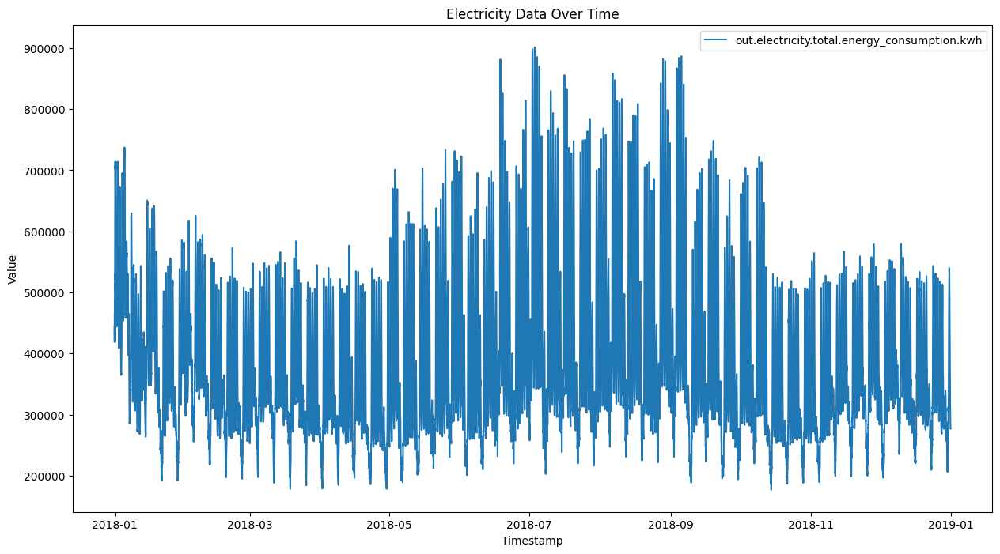

In [ ]:
import matplotlib.pyplot as plt

# Convert 'timestamp' to datetime and set as index
profile_com_agg['timestamp'] = pd.to_datetime(profile_com_agg['timestamp'])
profile_com_agg.set_index('timestamp', inplace=True)

#electricity_columns = [col for col in profile_1.columns if 'out.electricity.' in col]
electricity_columns = [col for col in profile_com_agg.columns if 'out.electricity.total' in col]
electricity_df = profile_com_agg[electricity_columns]

#units_represented = profile_com_agg['models_used']
#floor_area_represented = profile_com_agg['floor_area_represented']

#electricity_df = electricity_df.divide(floor_area_represented, axis='index')

# Plot
plt.figure(figsize=(15, 8))
for col in electricity_df.columns:
    plt.plot(electricity_df.index, electricity_df[col], label=col)

plt.legend(loc='upper right')
plt.title('Electricity Data Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.show()

In [ ]:
electricity_df.min()

out.electricity.total.energy_consumption.kwh    177130.237445
dtype: float64

In [ ]:
profile_com_agg.index = pd.to_datetime(profile_com_agg.index)
profile_com_agg['Date'] = profile_com_agg.index
profile_com_agg_hourly = profile_com_agg.resample('H').sum(numeric_only=True)

In [ ]:
profile_com_agg_hourly.min()

upgrade                                                      0.000000e+00
models_used                                                  1.673000e+03
floor_area_represented                                       1.017629e+09
out.district_cooling.cooling.energy_consumption.kwh          6.365192e+02
out.district_heating.heating.energy_consumption.kwh          0.000000e+00
out.district_heating.water_systems.energy_consumption.kwh    2.275220e+01
out.electricity.cooling.energy_consumption.kwh               9.237032e+03
out.electricity.exterior_lighting.energy_consumption.kwh     0.000000e+00
out.electricity.fans.energy_consumption.kwh                  4.996168e+04
out.electricity.heat_recovery.energy_consumption.kwh         1.804713e+02
out.electricity.heat_rejection.energy_consumption.kwh        0.000000e+00
out.electricity.heating.energy_consumption.kwh               0.000000e+00
out.electricity.interior_equipment.energy_consumption.kwh    1.214301e+05
out.electricity.interior_lighting.ener

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import numpy as np


daily_data = profile_com_agg['out.electricity.total.energy_consumption.kwh'].resample('1H').sum()
daily_data = daily_data.apply(lambda x: pd.Series(x).fillna(method='ffill').tolist())
daily_df = pd.DataFrame(daily_data.tolist(), index=daily_data.index)

In [ ]:
daily_df.max()

0    3.595007e+06
dtype: float64

In [ ]:
daily_df['Date'] = daily_df.index
daily_df['hour'] = daily_df.index.hour
daily_df.index = daily_df.index.date
daily_df_pivot = daily_df.pivot(columns='hour')
daily_df_pivot = daily_df.dropna()

In [ ]:
daily_df.reset_index(drop=True, inplace=True)
daily_df.columns = ['Energy', 'Timestamp', 'Hour']

daily_df_pivot = daily_df.pivot(index='Timestamp', columns='Hour', values='Energy')
daily_df_pivot.interpolate(method='cubic', inplace=True)
daily_df_pivot = daily_df_pivot.interpolate(method='cubic')
daily_df_pivot.fillna(0, inplace=True)

<Axes: xlabel='Hour'>

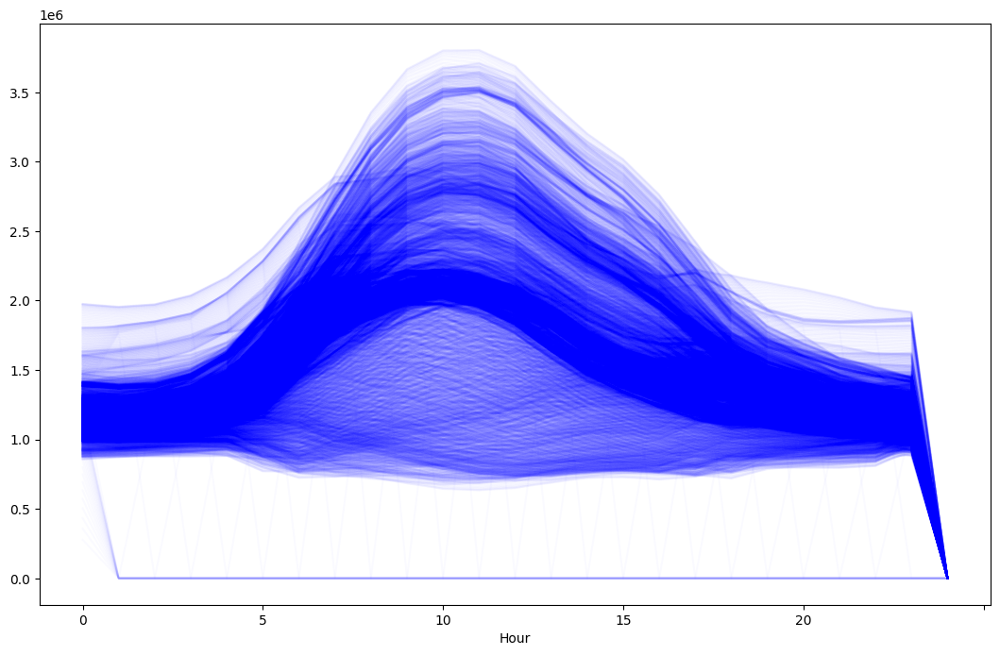

In [ ]:
daily_df_pivot.T.plot(figsize=(13,8), legend=False, color='blue', alpha=0.02)

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score
sillhoute_scores = []
n_cluster_list = np.arange(2,24).astype(int)

X = daily_df_pivot.values.copy()

# Very important to scale!
sc = MinMaxScaler()
X = sc.fit_transform(X)

for n_cluster in n_cluster_list:
  kmeans = KMeans(n_clusters=n_cluster, n_init=10)
  cluster_found = kmeans.fit_predict(X)
  sillhoute_scores.append(silhouette_score(X, kmeans.labels_))


sillhoute_scores_pandas = pd.DataFrame(sillhoute_scores)
sillhoute_scores_pandas = sillhoute_scores_pandas.rename(columns={0: "Score"})
sillhoute_scores_pandas['cluster'] = sillhoute_scores_pandas.index
sillhoute_scores_pandas['cluster'] += 1
sillhoute_scores_pandas

,Score,cluster
0,0.602771,1
1,0.514628,2
2,0.443675,3
3,0.414078,4
4,0.411660,5
5,0.415452,6
6,0.418813,7
7,0.338302,8
8,0.343747,9
9,0.344012,10


Text(0.5, 0, 'Hour')

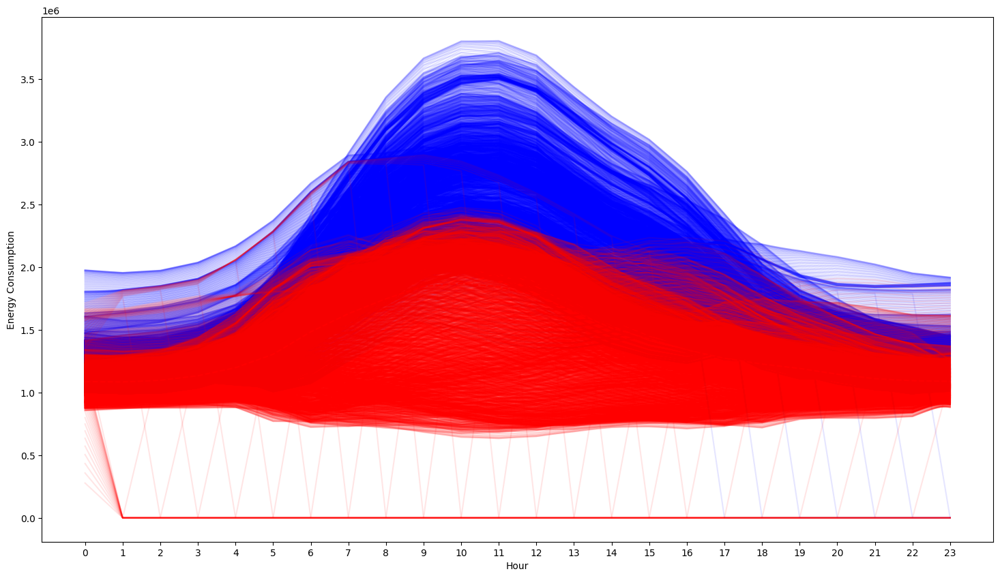

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

X = daily_df_pivot.values

# Scale the data
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Perform clustering
kmeans = KMeans(n_clusters=2, n_init=10)
daily_df_pivot['cluster'] = kmeans.fit_predict(X_scaled)

# Plot clusters
fig, ax = plt.subplots(1, 1, figsize=(18, 10))
colors = ['blue', 'red', 'green']

for cluster, color in zip(range(2), colors):
    data = daily_df_pivot[daily_df_pivot['cluster'] == cluster].drop('cluster', axis=1)
    data.T.plot(ax=ax, legend=False, alpha=0.1, color=color)
    data.median().plot(ax=ax, color=color, alpha=0.9, ls='--')

ax.set_xticks(np.arange(0, 24))
ax.set_ylabel('Energy Consumption')
ax.set_xlabel('Hour')

Text(0.5, 0, 'Hour')

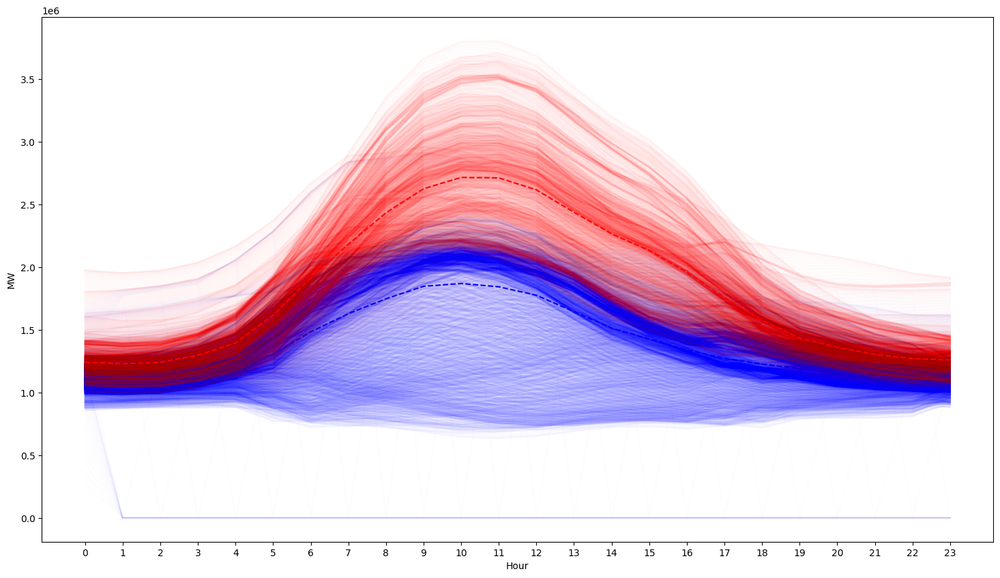

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(18, 10))
color_list = ['blue', 'red', 'green']

cluster_values = daily_df_pivot['cluster'].unique()

for cluster, color in zip(cluster_values, color_list):
    data_to_plot = daily_df_pivot[daily_df_pivot['cluster'] == cluster].drop('cluster', axis=1)
    data_to_plot.T.plot(ax=ax, legend=False, alpha=0.01, color=color)
    data_to_plot.median().plot(ax=ax, color=color, legend=False, alpha=1, ls='--')

ax.set_xticks(np.arange(0, 24))
ax.set_ylabel('MW')
ax.set_xlabel('Hour')


In [ ]:
# Create an empty DataFrame for storing median values
medians_df_com = pd.DataFrame()


# Loop through each cluster to calculate the median
for cluster in daily_df_pivot['cluster'].unique():
    data_to_plot = daily_df_pivot[daily_df_pivot['cluster'] == cluster].drop('cluster', axis=1)
    median_values = data_to_plot.median()

    # Divide by units_represented
    median_values /= 1e+05


    medians_df_com[f'Cluster_{cluster}'] = median_values

# Save the median values to a CSV file
medians_df_com.to_csv('cluster_medians_com.csv')

In [ ]:
medians_df_com

,Cluster_1,Cluster_0
Hour,,
0,10.863762,12.413621
1,10.834241,12.292295
2,10.971952,12.411640
3,11.331545,12.967164
4,11.973254,13.947135
5,13.044322,16.162491
6,14.832454,19.140822
7,16.279002,21.819545
8,17.470282,24.325202


### Generation (Solar)

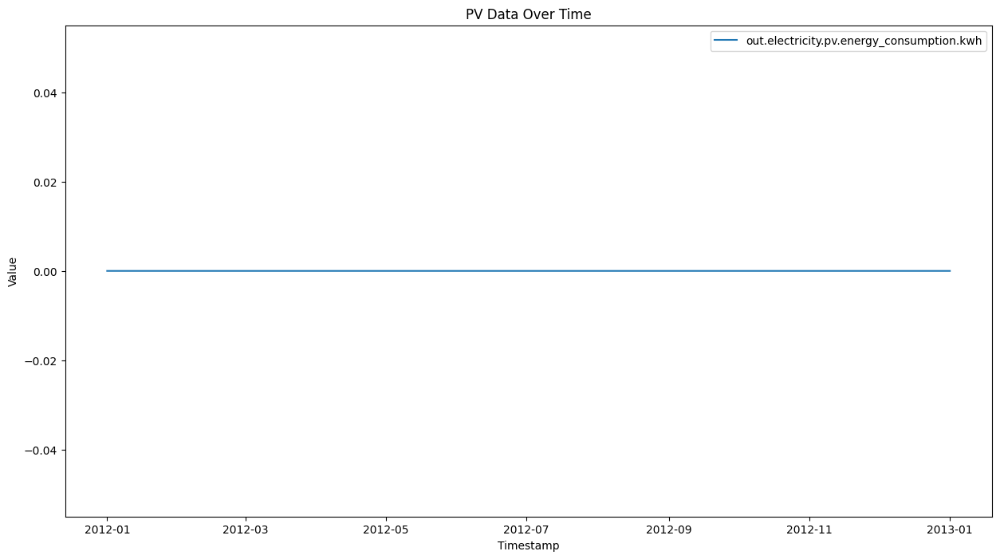

In [ ]:
import matplotlib.pyplot as plt

pv_columns = [col for col in profile_1_agg.columns if 'out.electricity.pv.energy_consumption.kwh' in col]
pv = profile_1_agg[pv_columns]

units_represented = profile_1_agg['units_represented']
pv_df = pv.divide(units_represented, axis='index')

# Plot
plt.figure(figsize=(15, 8))
for col in pv.columns:
    plt.plot(pv.index, pv[col], label=col)

plt.legend(loc='upper right')
plt.title('PV Data Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.show()

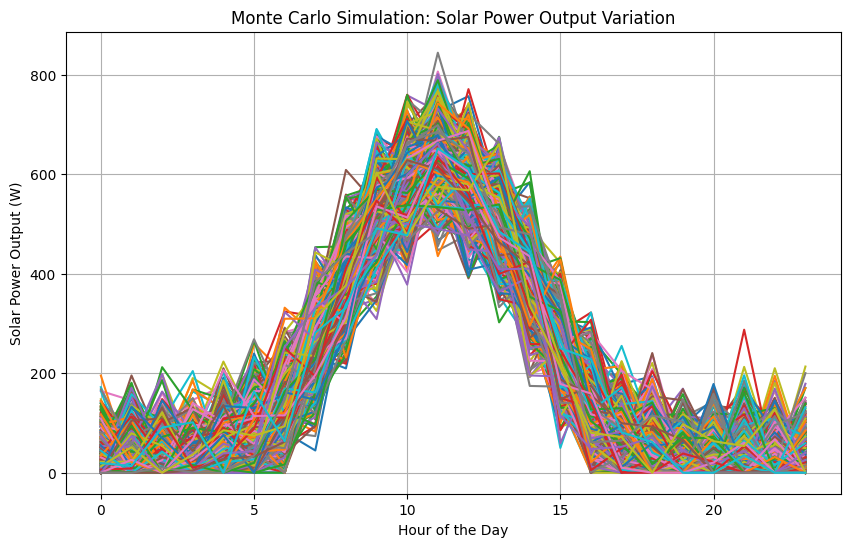

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Number of Monte Carlo iterations
n_iterations = 1000

# Initialize a list to store simulated Series
monte_carlo_list_power = []

# DNI data and constants
dni_data = {
    'Hour': list(range(24)),
    'DNI': [0, 0, 0, 0, 50, 100, 200, 400, 600, 800, 900, 1000, 900, 800, 600, 400, 200, 100, 50, 0, 0, 0, 0, 0]
}
dni_df = pd.DataFrame(dni_data)

# Constants
efficiency = 0.40  # 40
area = 1.6  # m^2

# Perform Monte Carlo simulation
for i in range(n_iterations):
    # Generate random DNI values for each hour
    dni_simulated = np.maximum(np.random.normal(dni_df['DNI'], scale=100), 0)  # Ensure non-negative values

    # Calculate power output using the efficiency and area constants
    power_output_simulated = dni_simulated * efficiency * area

    # Store in a Series and append to list
    monte_carlo_list_power.append(pd.Series(power_output_simulated, name=f'Iteration_{i}'))

# Create DataFrame from list of Series
monte_carlo_df_power = pd.concat(monte_carlo_list_power, axis=1)

# Save the simulated power output values to a CSV file
monte_carlo_df_power.to_csv('monte_carlo_power_output_simulation.csv')

# Plot the power output for all iterations
plt.figure(figsize=(10, 6))
for i in range(n_iterations):
    plt.plot(dni_df['Hour'], monte_carlo_df_power[f'Iteration_{i}'], label=f'Iteration {i}')

plt.xlabel('Hour of the Day')
plt.ylabel('Solar Power Output (W)')
plt.title('Monte Carlo Simulation: Solar Power Output Variation')
#plt.legend()
plt.grid(True)
plt.show()


In [ ]:
solar = pd.read_csv('https://docs.google.com/spreadsheets/d/1JODFaykdFyRqdhbu4Cwzi2zfXjp1Ybmis4kox7-NaPk/export?format=csv&gid=0',skiprows=1, header=0, sep=',')

In [ ]:
import pandas as pd

# Create a date range for the entire year
date_range = pd.date_range(start='2023-01-01', end='2023-12-31', freq='1H')

time_series_data = []

# Iterate through the date range
for date in date_range:
    month_name = date.strftime('%b')
    day = date.day
    for timeslot in range(24):
        timestamp = f"2023-{month_name}-{day:02d} {timeslot:02d}:00:00"
        value = solar[month_name].iloc[timeslot]
        time_series_data.append((timestamp, value))


# Create DataFrame
ts_df = pd.DataFrame(time_series_data, columns=['Timestamp', 'Value'])
ts_df['Timestamp'] = pd.to_datetime(ts_df['Timestamp'])
ts_df.set_index('Timestamp', inplace=True)

In [ ]:
import pandas as pd

date_range = pd.date_range(start='2023-01-01', end='2023-12-31', freq='1H')

# Convert 'Unnamed: 0' to just the starting hour as integers
solar['Hour'] = solar['Unnamed: 0'].apply(lambda x: int(x.split(' - ')[0]))

# Create the time_series_data list for storing data
time_series_data = []

# Iterate through the date_range
for date in date_range:
    month_name = date.strftime('%b')
    hour = date.hour

    # Fetch value based on hour and month_name
    value = solar.loc[solar['Hour'] == hour, month_name].values[0]

    timestamp = date.strftime('%Y-%m-%d %H:%M:%S')
    time_series_data.append((timestamp, value))

# Create DataFrame
ts_df = pd.DataFrame(time_series_data, columns=['Timestamp', 'Value'])
ts_df['Timestamp'] = pd.to_datetime(ts_df['Timestamp'])
ts_df.set_index('Timestamp', inplace=True)


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import numpy as np

# Missing values and
daily_data = daily_data.apply(lambda x: pd.Series(x).fillna(method='ffill').tolist())
daily_df = pd.DataFrame(daily_data.tolist(), index=daily_data.index)

In [ ]:
ts_df['Date'] = ts_df.index
ts_df['hour'] = ts_df.index.hour
ts_df.index = ts_df.index.date

ts_df_pivot = ts_df.pivot(columns='hour')
ts_df_pivot = ts_df.dropna()

In [ ]:
ts_df.reset_index(drop=True, inplace=True)
ts_df.columns = ['Energy', 'Timestamp', 'Hour']

ts_df_pivot = ts_df.pivot(index='Timestamp', columns='Hour', values='Energy')
ts_df_pivot.interpolate(method='cubic', inplace=True)
ts_df_pivot = ts_df_pivot.interpolate(method='cubic')
ts_df_pivot.fillna(0, inplace=True)

<Axes: xlabel='Hour'>

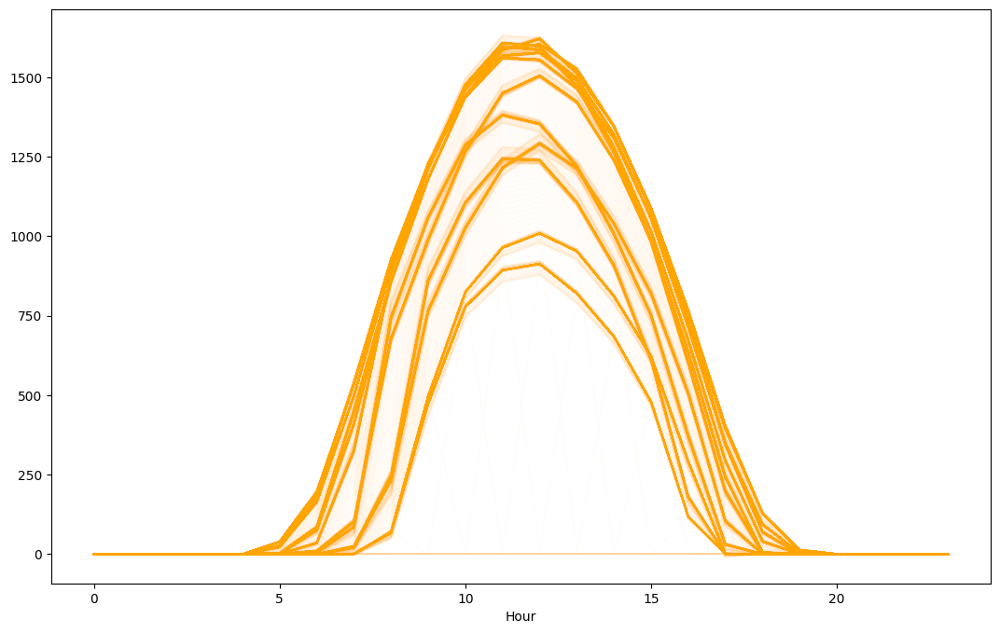

In [ ]:
ts_df_pivot.T.plot(figsize=(13,8), legend=False, color='orange', alpha=0.02)

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score
sillhoute_scores = []
n_cluster_list = np.arange(2,24).astype(int)

X = ts_df_pivot.values.copy()

# Very important to scale!
sc = MinMaxScaler()
X = sc.fit_transform(X)

for n_cluster in n_cluster_list:
  kmeans = KMeans(n_clusters=n_cluster,n_init=10)
  cluster_found = kmeans.fit_predict(X)
  sillhoute_scores.append(silhouette_score(X, kmeans.labels_))

sillhoute_scores_pandas = pd.DataFrame(sillhoute_scores)
sillhoute_scores_pandas = sillhoute_scores_pandas.rename(columns={0: "Score"})
sillhoute_scores_pandas['cluster'] = sillhoute_scores_pandas.index
sillhoute_scores_pandas['cluster'] += 1
sillhoute_scores_pandas

,Score,cluster
0,0.558772,1
1,0.607635,2
2,0.588220,3
3,0.598871,4
4,0.634156,5
5,0.695876,6
6,0.753442,7
7,0.811763,8
8,0.861763,9
9,0.898248,10


<Axes: xlabel='cluster'>

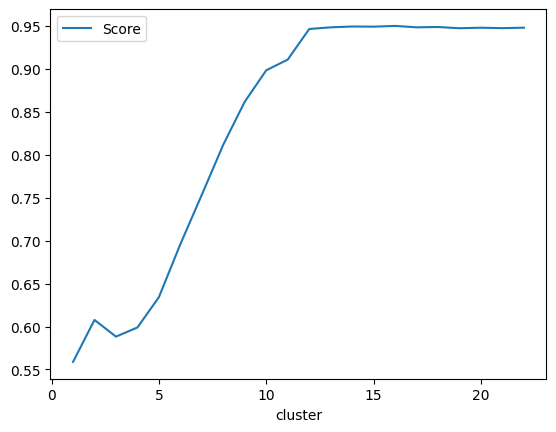

In [ ]:
sillhoute_scores_pandas.plot(x='cluster', y='Score')

Text(0.5, 0, 'Hour')

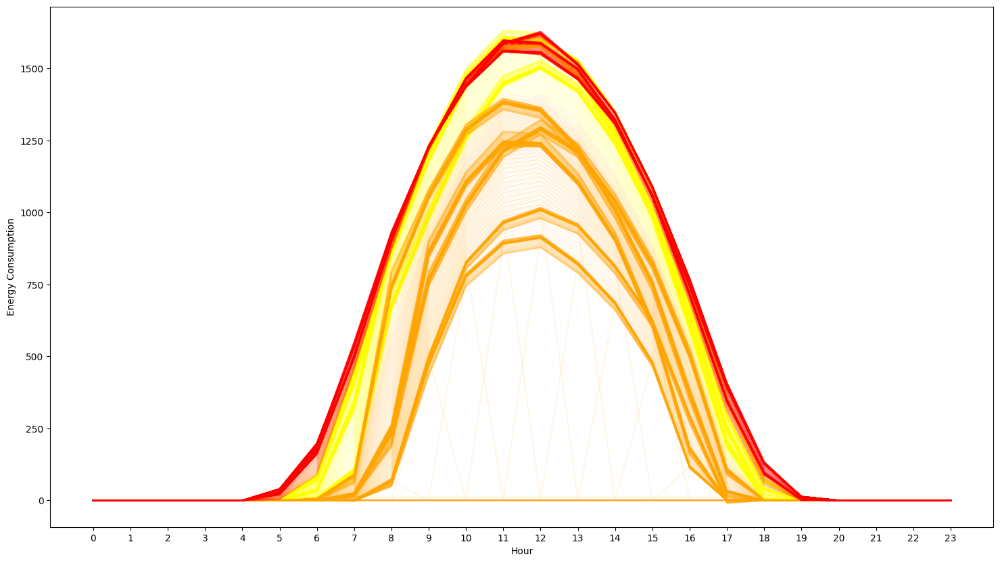

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

X = ts_df_pivot.values

# Scale the data
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Perform clustering
kmeans = KMeans(n_clusters=3,n_init=10) #0.950573 (16 is a lot)
ts_df_pivot['cluster'] = kmeans.fit_predict(X_scaled)

# Plot clusters
fig, ax = plt.subplots(1, 1, figsize=(18, 10))
colors = ['yellow', 'orange','red']

for cluster, color in zip(range(3), colors):
    data = ts_df_pivot[ts_df_pivot['cluster'] == cluster].drop('cluster', axis=1)
    data.T.plot(ax=ax, legend=False, alpha=0.1, color=color)
    data.median().plot(ax=ax, color=color, alpha=0.9, ls='--')

ax.set_xticks(np.arange(0, 24))
ax.set_ylabel('Energy Consumption')
ax.set_xlabel('Hour')

Text(0.5, 0, 'Hour')

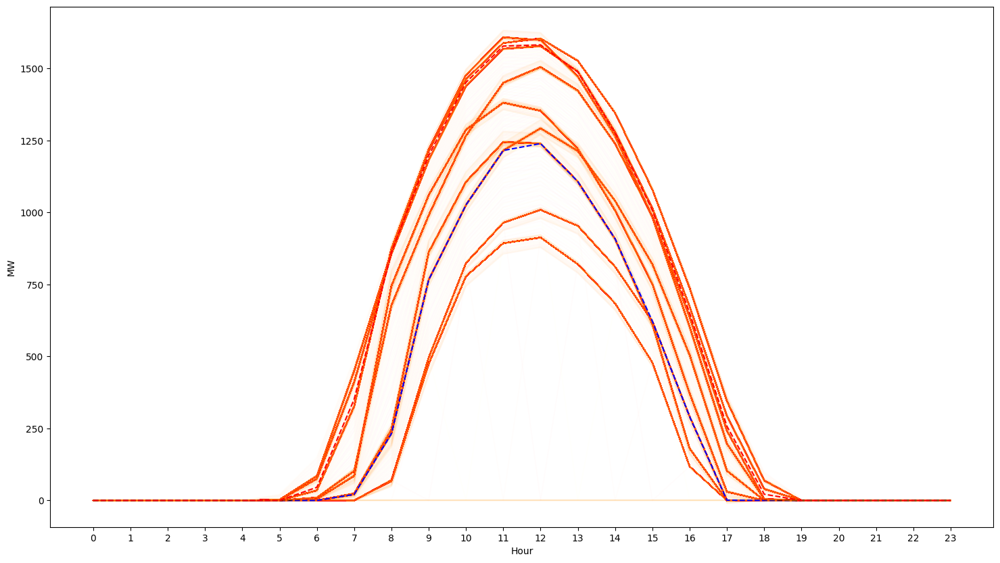

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(18, 10))
colors = ['yellow', 'orange','red']

cluster_values = daily_df_pivot['cluster'].unique()

for cluster, color in zip(cluster_values, color_list):
    data_to_plot = ts_df_pivot[ts_df_pivot['cluster'] == cluster].drop('cluster', axis=1)
    data_to_plot.T.plot(ax=ax, legend=False, alpha=0.01, color=colors)
    data_to_plot.median().plot(ax=ax, color=color, legend=False, alpha=1, ls='--')

ax.set_xticks(np.arange(0, 24))
ax.set_ylabel('MW')
ax.set_xlabel('Hour')



In [ ]:
medians_df_solar = pd.DataFrame()

# Loop through each cluster to calculate the median
for cluster in ts_df_pivot['cluster'].unique():
    data_to_plot = ts_df_pivot[ts_df_pivot['cluster'] == cluster].drop('cluster', axis=1)
    median_values = data_to_plot.median()

        # Divide by units_represented
    median_values /= 1e+03

    medians_df_solar[f'Cluster_{cluster}'] = median_values

# Save the median values to a CSV file
medians_df_solar.to_csv('cluster_medians_solar.csv')

In [ ]:
medians_df_solar

,Cluster_1,Cluster_0,Cluster_2
Hour,,,
0,0.000000e+00,0.000000,0.000
1,0.000000e+00,0.000000,0.000
2,0.000000e+00,0.000000,0.000
3,0.000000e+00,0.000000,0.000
4,0.000000e+00,0.000000,0.000
5,0.000000e+00,0.000085,0.027
6,8.504561e-30,0.045701,0.180
7,2.100000e-02,0.351316,0.535
8,2.320000e-01,0.861732,0.917


### Generation (Storage)

In [ ]:
import pandapower as pp
# Add buses
bus1 = pp.create_bus(net, vn_kv=20.0, name="Bus 1")

# Add a storage unit
storage1 = pp.create_storage(net, bus=bus1, p_mw=0, max_p_kw=1, max_e_mwh=0.01)

# Print the network to see the changes
print(net)

This pandapower network includes the following parameter tables:
   - bus (46 element)
   - load (15 element)
   - storage (2 element)
   - switch (3 element)
   - ext_grid (1 elements)
   - line (37 element)
   - trafo (3 element)
   - bus_geodata (44 element)


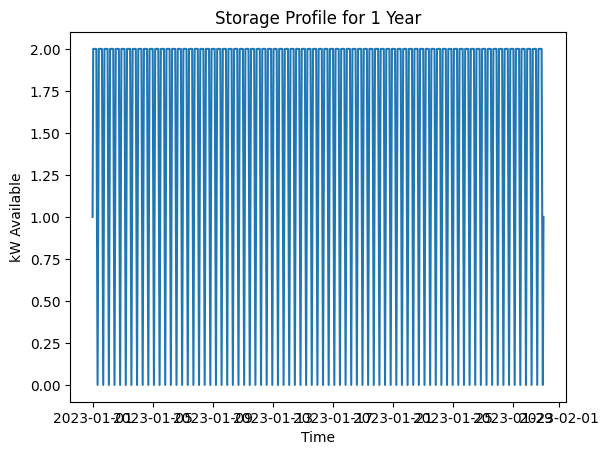

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Create a date range for 1 year
date_range = pd.date_range(start='2023-01-01', end='2023-01-31', freq='1H')

# Initialize DataFrame for kW storage
storage_df = pd.DataFrame(index=date_range, columns=['kW_Available'])

# Initialize variables
storage_level = 0.0  # kW
storage_capacity = 5.0  # kW

# Periods (in hours)
charging_period = 2  # Charging for 2 hours
full_period = 5  # Full for 5 hours
discharging_period = 2  # Discharging for 2 hours

# Calculate a single cycle duration
cycle_duration = charging_period + full_period + discharging_period

# Populate DataFrame
for i, timestamp in enumerate(date_range):
    cycle_position = i % cycle_duration  # Position within the current cycle

    if cycle_position < charging_period:
        storage_level += 1.0  # Increase by 1 kW
    elif cycle_position < charging_period + full_period:
        # Storage level stays the same (Full)
        pass
    elif cycle_position < cycle_duration:
        storage_level -= 1.0  # Decrease by 1 kW

    storage_df.loc[timestamp, 'kW_Available'] = storage_level

# Plotting
plt.plot(storage_df.index, storage_df['kW_Available'])
plt.xlabel('Time')
plt.ylabel('kW Available')
plt.title('Storage Profile for 1 Year')
plt.show()


## Network

In [ ]:
import pandapower as pp
import pandapower.networks as pn
from pandapower.plotting.plotly import vlevel_plotly

net = pn.create_cigre_network_lv()
net.name = "cigre network lv"
fig = vlevel_plotly(net)
fig.update_layout(width=800, height=600)
fig.show()

# Number of buses
n_buses = len(net.bus)

## Coupled P and Q

In [ ]:
median_loads_df_scale = median_loads_df

In [ ]:
medians_df_solar_scale = medians_df_solar
medians_df_solar_scale

,Cluster_1,Cluster_0,Cluster_2
Hour,,,
0,0.000000e+00,0.000000,0.000
1,0.000000e+00,0.000000,0.000
2,0.000000e+00,0.000000,0.000
3,0.000000e+00,0.000000,0.000
4,0.000000e+00,0.000000,0.000
5,0.000000e+00,0.000085,0.027
6,8.504561e-30,0.045701,0.180
7,2.100000e-02,0.351316,0.535
8,2.320000e-01,0.861732,0.917


In [ ]:
import pandapower as pp
import pandapower.networks as nw
import pandapower.plotting as plot
import networkx as nx
import numpy as np
from scipy.sparse import csr_matrix

# Create a graph from the network
graph = pp.topology.create_nxgraph(net)

# Remove all loads and generations
net.load.drop(net.load.index, inplace=True)
net.sgen.drop(net.sgen.index, inplace=True)
net.gen.drop(net.gen.index, inplace=True)

# Transpose the DataFrame
transposed_df = median_loads_df_scale.T
# Take just the first row (hour 1 for now)
first_row = transposed_df.iloc[:, 11]
#Removing previous values
net.load.drop(net.load.index, inplace=True)

# Find extreme buses (logic is that loads and sgen will be here....)
extreme_buses = [node for node, degree in graph.degree() if degree == 1]
extreme_buses

# set loads on these
for bus in extreme_buses:
    load = first_row.get(bus, 0)
    q_value = np.abs(load * np.tan(np.arccos(0.99)))
    pp.create_load(net, bus=int(bus), p_mw=load/1e6,q_mvar=q_value/1e6)

# Calculate 50% of the extreme buses
num_to_add = int(len(extreme_buses) * 0.5)

# Randomly select 30% of the extreme buses
np.random.shuffle(extreme_buses)
selected_buses = extreme_buses[:num_to_add]

#Removing previous values
net.sgen.drop(net.sgen.index, inplace=True)

# Transpose the DataFrame for solar data
transposed_df_solar = medians_df_solar_scale.T

# Take just the first row (hour 1 for now)
first_row_solar = transposed_df_solar.iloc[:, 11]

# Add sgens to the selected buses using solar data
for bus in selected_buses:
    solar_value = first_row_solar[0] #1st cluster
    q_value = np.abs(solar_value * np.tan(np.arccos(0.99)))
    pp.create_sgen(net, bus=bus, p_mw=solar_value/1e3, q_mvar=q_value/1e3)

In [ ]:
# Run the power flow
pp.runpp(net)

In [ ]:
net

This pandapower network includes the following parameter tables:
   - bus (44 element)
   - load (13 element)
   - sgen (6 element)
   - switch (3 element)
   - ext_grid (1 elements)
   - line (37 element)
   - trafo (3 element)
   - bus_geodata (44 element)
 and the following results tables:
   - res_bus (44 element)
   - res_line (37 element)
   - res_trafo (3 element)
   - res_ext_grid (1 elements)
   - res_load (13 element)
   - res_sgen (6 element)
   - res_switch (3 element)